In [ ]:
import wandb

In [10]:
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()

my_secret = user_secrets.get_secret("WANDB_API") 

wandb.login(key=my_secret)

wandb: Currently logged in as: da24m016 (da24m016-indian-institute-of-technology-madras). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [ ]:
# Installing the required packages if not already installed (uncomment if needed)
# !pip install pytorch-lightning wandb

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader, Subset
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
import wandb
import numpy as np
from collections import defaultdict
import os



In [ ]:
# common configuration parameters that are not swept (can be overridden by sweep config)
common_config = {
    "img_size": 128,
    "num_classes": 10,      
    "batch_size": 32,
    "epochs": 10
}

# wandb sweep configuration
sweep_config = {
    'method': 'bayes',  
    'metric': {
        'name': 'val_acc',
        'goal': 'maximize'
    },
    'parameters': {
        'filter_organization': {
            'values': ['same', 'double', 'half']
        },
        'activation': {
            'values': ['relu', 'gelu', 'silu', 'mish']
        },
        'data_augmentation': {
            'values': [True, False]
        },
        'batch_norm': {
            'values': [True, False]
        },
        'dropout': {
            'values': [0.2, 0.3]
        },
        'dense_neurons': {
            'values': [256, 512]
        },
        'learning_rate': {
            'values': [1e-3, 1e-4]
        }
    }
}

# creating a sweep id
sweep_id = wandb.sweep(sweep_config, project="da6401_assignment2")
print("Sweep ID:", sweep_id)


In [ ]:
# pytorch lightning model class
class LitCNN(pl.LightningModule):
    
    def __init__(self, config):
        super(LitCNN, self).__init__()
        self.save_hyperparameters(dict(config))
        self.config = config
        
        # filter configuration based on 'filter_organization'
        if config["filter_organization"] == 'same':
            conv_filters = [32] * 5
        elif config["filter_organization"] == 'double':
            conv_filters = [32, 64, 128, 256, 512]
        elif config["filter_organization"] == 'half':
            conv_filters = [512, 256, 128, 64, 32]
        else:
            raise ValueError("Unsupported filter organization")
        
        self.conv_filters = conv_filters
        
        self.activation_fn = self._get_activation(config["activation"])
        in_channels = 3
        conv_layers = []
        
        # building 5 conv-activation-(batch_norm)-maxpool blocks
        for out_channels in conv_filters:
            conv_layers.append(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1))
            if config["batch_norm"]:
                conv_layers.append(nn.BatchNorm2d(out_channels))
            conv_layers.append(self._get_activation(config["activation"]))
            conv_layers.append(nn.MaxPool2d(kernel_size=2))
            in_channels = out_channels
        self.conv = nn.Sequential(*conv_layers)
        
        # calculating flattened dimension after conv layers
        final_size = config["img_size"] // (2 ** 5)
        self.flatten_dim = conv_filters[-1] * final_size * final_size
        
        # fully connected layers with dropout applied after fc1
        self.fc1 = nn.Linear(self.flatten_dim, config["dense_neurons"])
        self.dropout = nn.Dropout(config["dropout"])
        self.fc2 = nn.Linear(config["dense_neurons"], config["num_classes"])
    
    def _get_activation(self, act):
        act = act.lower()
        if act == 'relu':
            return nn.ReLU()
        elif act == 'gelu':
            return nn.GELU()
        elif act == 'silu':
            return nn.SiLU()
        elif act == 'mish':
            return nn.Mish()
        else:
            raise ValueError(f"Unsupported activation: {act}")

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)  
        x = self.fc1(x)
        x = self._get_activation(self.config["activation"])(x)
        x = self.dropout(x)
        x = self.fc2(x)
        return x

    def training_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        loss = F.cross_entropy(outputs, labels)
        acc = (outputs.argmax(dim=1) == labels).float().mean()
        self.log("train_loss", loss, prog_bar=True)
        self.log("train_acc", acc, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        images, labels = batch
        outputs = self(images)
        # using cross_entropy for loss calculation
        loss = F.cross_entropy(outputs, labels)
        acc = (outputs.argmax(dim=1) == labels).float().mean()
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc", acc, prog_bar=True)
        return {"val_loss": loss, "val_acc": acc}

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.config["learning_rate"])
        return optimizer


In [ ]:
def get_transforms(config):
    if config["data_augmentation"]:  
        transform = transforms.Compose([
            transforms.Resize((config["img_size"], config["img_size"])),
            transforms.RandomHorizontalFlip(),
            transforms.RandomRotation(10),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])
    else:
        transform = transforms.Compose([
            transforms.Resize((config["img_size"], config["img_size"])),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])
    return transform


def prepare_data(config):
    # data_path to your Kaggle dataset location
    data_path = "/kaggle/input/inaturalist-dataset/inaturalist_12K/train"  
    transform = get_transforms(config)
    dataset = datasets.ImageFolder(root=data_path, transform=transform)
    
    # stratified split ensuring each class is equally represented
    class_indices = defaultdict(list)
    for idx, (_, label) in enumerate(dataset.samples):
        class_indices[label].append(idx)

    train_indices = []
    val_indices = []
    for label, indices in class_indices.items():
        indices = np.array(indices)
        np.random.shuffle(indices)
        split = int(0.8 * len(indices))
        train_indices.extend(indices[:split])
        val_indices.extend(indices[split:])
    
    train_dataset = Subset(dataset, train_indices)
    val_dataset = Subset(dataset, val_indices)
    
    train_loader = DataLoader(train_dataset, batch_size=config["batch_size"], shuffle=True, num_workers=2)
    val_loader = DataLoader(val_dataset, batch_size=config["batch_size"], shuffle=False, num_workers=2)
    return train_loader, val_loader


In [ ]:
def train():
    
    run = wandb.init()
    config = run.config
    
    for key, value in common_config.items():
        if key not in config:
            config[key] = value

    # run name using the hyperparameters
    run.name = f"fo_{config.filter_organization}_act_{config.activation}_aug_{config.data_augmentation}_bn_{config.batch_norm}_do_{config.dropout}_dn_{config.dense_neurons}_lr_{config.learning_rate}"
    run.save()  

    # using the data loaders based on current configuration
    train_loader, val_loader = prepare_data(config)
    
    # wandb logger for PyTorch Lightning
    wandb_logger = WandbLogger(project="da6401_assignment2", log_model="all")
    
    model = LitCNN(config)
    
    # using pytorch lightning trainer for training
    trainer = pl.Trainer(
        max_epochs=config.epochs,
        logger=wandb_logger,
        accelerator="gpu" if torch.cuda.is_available() else "cpu"
    )
    
    # training the model
    trainer.fit(model, train_dataloaders=train_loader, val_dataloaders=val_loader)
    
    run.finish()


In [ ]:
wandb.agent(sweep_id, function=train, count=30)

wandb: Agent Starting Run: m0j3gr0k with config:
wandb: 	activation: silu
wandb: 	batch_norm: True
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loggers/wandb.py:397: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇█████
train_acc,▂▃▁▃▅▄▁▄▃▄▅▃▃▄▃▃▅▅▂▅▄▆▄▂▅▅▅▆▅▆▂▅▆▅▄▄▅▄█▅
train_loss,███▇▇▄▆█▅▇▃▆▅█▃▄▅▄▃▇▅▄▁▅▆▄▄▂▂▃▄▄▃▅▄▅▅▅▂▃
trainer/global_step,▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇████
val_acc,▁▄▄▅▅▆▆▇▆█
val_loss,█▆▅▄▃▃▂▂▃▁
epoch,9
train_acc,0.3871
train_loss,1.69763
trainer/global_step,2499
val_acc,0.364


wandb: Agent Starting Run: 2e9s8ht8 with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇█████
train_acc,▂▁▅▃▃▃▃▅▅▃▅▃▃▃▃▅▃▆▄▆▃▆▆▅▇▅▅▅▂█▆▇▆▃▅▅▆▃▆▅
train_loss,▇█▆▄▆▆▆▆▅▄▄▄▇▅▅▃▆▃▄▄▆▄▃▄▁▃▃▂▅▁▃▃▃▅▂▄▂▅▃▄
trainer/global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▃▃▄▆▆▆███
val_loss,█▆▆▄▃▃▂▁▁▁
epoch,9
train_acc,0.32258
train_loss,1.73227
trainer/global_step,2499
val_acc,0.373


wandb: Agent Starting Run: 91q3p12h with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 512
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇███
train_acc,▁▂▃▃▃▃▄▃▄▂▃▅▃▆▄▃▄▆▃▄▅▅▃▅▅▇▅▅▆▆▄█▆▇▇▆▇▇▅▇
train_loss,▇▇▆█▇▅▆▆▆▆▅▅▄▅▆▆▅▄▅▄▄▂▄▆▃▅▂▄▄▃▃▅▂▁▁▃▂▂▃▂
trainer/global_step,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
val_acc,▁▄▅▅▅▆▇▇▆█
val_loss,█▅▃▃▃▂▁▁▃▂
epoch,9
train_acc,0.58065
train_loss,1.15911
trainer/global_step,2499
val_acc,0.4015


wandb: Agent Starting Run: fyabkn65 with config:
wandb: 	activation: silu
wandb: 	batch_norm: True
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇████
train_acc,▁▂▃▃▂▃▂▄▃▃▃▃▄▄▃▃▅▄▄▄▅▅▅▆▅▆▅▆▅▆▆▅▆▇▇▇███▆
train_loss,██▇▇█▇█▇▆▇▆▇▆▆▆▅▇▆▆▅▅▅▄▄▄▄▃▃▄▃▃▃▃▁▂▂▂▁▁▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
val_acc,▁▂▁▃▇█▇▇▆▆
val_loss,▃▂▄▂▁▂▁▄██
epoch,9
train_acc,0.74194
train_loss,0.64187
trainer/global_step,2499
val_acc,0.3865


wandb: Agent Starting Run: o4ow1i9y with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: same
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇█████
train_acc,▁▁▁▃▃▄▅▂▃▃▅▃▆▅▃▃▅▄▄▄▇▇▄▆▄▄▆▄▆▅▃▄▆▆▅▅█▇▆▇
train_loss,██▇▇▇▇▆▇▇▄▅▃▄▇▆▆▅▅▅▅▃▅▄▃▅▅▅▂▄▂▂▅▃▂▃▄▄▃▂▁
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▄▅▅██▅█▇█
val_loss,█▅▄▃▁▁▅▁▁▂
epoch,9
train_acc,0.6129
train_loss,1.23923
trainer/global_step,2499
val_acc,0.3685


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: lw9c6f1z with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 512
wandb: 	dropout: 0.3
wandb: 	filter_organization: same
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇████
train_acc,▃▄▃▁▂▃▁▅▄▄▃▅▄▄▄▃▃▄▃▂▁▅█▄▄▂▅▃▄▆▄▂▂▄▅▅▃█▄▄
train_loss,▇▆▆▇█▆▇▇▅▅▆▄▅▅▄▆▆▅▃▆▅▅▆▄▃▄▆▃▅▅█▆▆▄▂▅▃▁▅▄
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
val_acc,▁▂▆▆▇▇████
val_loss,█▇▄▃▂▂▂▂▁▁
epoch,9
train_acc,0.29032
train_loss,1.99089
trainer/global_step,2499
val_acc,0.291


wandb: Agent Starting Run: gr9rcrkt with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇███
train_acc,▁▃▇▄▃▅▄▃▅▄▃▃▆▃▅▇▆▃▄▇▇▆▇▇▅▃▅▅█▅▅▄▇▇▇▇▆▅▅▆
train_loss,█▇▅▇▇▅▅▅▆▇▆▆▅▆▄▃▅▅▄▆▃▃▃▅▂▅▄▂▅▃▅▃▁▃▄▃▁▃▃▃
trainer/global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
val_acc,▁▂▄▄▅▆▆▇██
val_loss,█▇▅▅▃▃▂▂▁▁
epoch,9
train_acc,0.3871
train_loss,1.7506
trainer/global_step,2499
val_acc,0.369


wandb: Agent Starting Run: l4zvuykg with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 512
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇█████
train_acc,▁▄▄▂▅▃▅▂▄▅▃▃▄▄▅▄▅▅▃▄▅▃▆▅▅▆▅▃▅▄▅▄▇▅▅▆▆█▆▆
train_loss,█▆▆▆▇▅▆▅▆▇▄▆▆▆▅▅▅▅▅▅▅▅▅▃▄▅▂▅▅▃▃▄▄▃▃▂▃▂▁▅
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
val_acc,▁▄▃▆▇█▇▇▇▇
val_loss,▄▄▄▂▁▁▁▄▆█
epoch,9
train_acc,0.48387
train_loss,1.47536
trainer/global_step,2499
val_acc,0.3095


wandb: Agent Starting Run: 7ot0a3zh with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇████
train_acc,▁▁▃▂▃▂▅▂▄▅▃▄▄▅▄▅▇█▄▅▄▅▄▄▅▅▅▄▅▄▅▆▅▄▇▆▃▅▆▆
train_loss,██▇▇██▅▆▅▅▆▆▅▅▆▆▄▂▄▄▆▄▅▆▃▃▄▅▅▆▅▂▃▄▂▆▅▃▁▂
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
val_acc,▁▃▆▆▆▇▆█▇█
val_loss,█▅▃▃▂▁▁▁▂▁
epoch,9
train_acc,0.48387
train_loss,1.50441
trainer/global_step,2499
val_acc,0.36


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: hv5ml5tn with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇█████
train_acc,▂▄▁▂▅▄▅▅▄▆▃▄▄▄▄▇▆▄▅▆▇▇▇▇▅▄▆▆▅▅▆▇▇█▄▇▇▇▇▇
train_loss,▆▆▆█▅▆▅▅▃▅▆▄▅▆▄▃▅▄▃▄▂▂▁▁▃▃▃▂▂▁▅▃▃▂▄▄▂▃▃▁
trainer/global_step,▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
val_acc,▁▃▄▅▆▆▇▇▇█
val_loss,█▆▄▄▃▃▁▂▁▁
epoch,9
train_acc,0.41935
train_loss,1.56278
trainer/global_step,2499
val_acc,0.3465


wandb: Agent Starting Run: zdzvi2li with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 512
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇████
train_acc,▁▅▂▁▂▆▄▅▃▄▆▃▆▅▃▃▅▁▅▇▆▆▃▇▅▆▃▅▄▅▄██▄▆▆▆▃▇▇
train_loss,█▆▇▆▅▆▅▆▆▅▆▄▆▄▆▃█▄▄▄▄▄▃▅▄▆▃▅▅▄▁▄▃▃▃▂▃▆▃▂
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇██
val_acc,▁▃▅▅▆▇▇███
val_loss,█▆▅▄▃▃▂▁▁▁
epoch,9
train_acc,0.45161
train_loss,1.52518
trainer/global_step,2499
val_acc,0.366


wandb: Agent Starting Run: bt18qsqn with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇███
train_acc,▃▁▃▃▄▃▄▁▄▅▃▄▁▅▄▃▅▇▆▄▇▆█▅▆▇▆▆▄▆▆▅▄▅▆▇▅▅▇▄
train_loss,▇█▇▇▅▆▅▇▅▅▄▆▇▃▆▄▅▂▃▅▂▄▂▅▃▃▄▂▄▃▅▃▃▂▃▂▅▃▁▂
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇██
val_acc,▁▂▃▄▆▇▇▇▇█
val_loss,█▇▆▄▃▂▁▂▂▁
epoch,9
train_acc,0.32258
train_loss,1.62239
trainer/global_step,2499
val_acc,0.355


wandb: Agent Starting Run: 3g3vs09c with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇██
train_acc,▁▁▄▅▄▃▁▅▅▃▅▇▅▂▄▇▃▆▄▆▃▇▅▆▅▆▄▅▆▄▅▃▆▅▆▄▄▆█▄
train_loss,▇▇▇▄▆▅▇█▅▅▅▅▅▅▂▁▄▃▃▅▅▂▃▃▂▆▂▁▅▂▇▃▃▄▃▃▅▂▁▅
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
val_acc,▁▂▃▅▆▆▆▆█▆
val_loss,█▇▆▄▃▃▂▂▁▁
epoch,9
train_acc,0.25806
train_loss,2.01731
trainer/global_step,2499
val_acc,0.3405


wandb: Agent Starting Run: d513cvdp with config:
wandb: 	activation: silu
wandb: 	batch_norm: True
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇████
train_acc,▂▄▂▂▁▃▄▄▁▃▅▃▄▄▄▄▄▄▅▅▄▃▂▄▄▅▄▅██▆▇▆▄▆▆▆█▇▅
train_loss,█▇▇██▇▇▅▆▅▅█▃▆▅▆▆▇▅▄▄▅▅▅▅▄▅▄▃▅▁▃▂▂▃▃▂▂▂▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇██
val_acc,▁▃▄▆▇█▆█▇█
val_loss,█▆▅▂▂▁▂▁▁▁
epoch,9
train_acc,0.41935
train_loss,1.47715
trainer/global_step,2499
val_acc,0.391


wandb: Agent Starting Run: qvcrnl1t with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇████
train_acc,▁▁▂▂▃▁▃▃▅▃▃▄▃▃▄▄▃▄▄▃▆▃▂▄▆▆▆▇▃▄▆▄▆▅▇▅█▄▇▆
train_loss,██▇▆█▇▇▅▅▅▇▄▆▅▃▅▄▄▄▆▃▄▆▄▂▃▃▂▅▃▃▃▃▂▂▄▁▃▂▃
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███
val_acc,▁▂▄▄▅▆▇▇▇█
val_loss,█▇▅▄▃▃▂▁▂▁
epoch,9
train_acc,0.48387
train_loss,1.64649
trainer/global_step,2499
val_acc,0.3645


wandb: Agent Starting Run: vwk2dycj with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.3
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇████
train_acc,▁▂▃▃▃▂▃▂▃▅▄▅▃▄▃▄▅▂▅▅▅▄▅▆▃▆▄▅▃▆▃▆▄▂▃▆█▅▄▇
train_loss,█▇█▇▆▇▆█▅▇▆▆▆▅▇▅▇▅▅▅▆▆▅▄▆▃▅▆▃▄▃▅▇▅▅▃▁▄▆▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
val_acc,▁▃▅▅▆▆▇▇██
val_loss,█▆▅▄▃▃▂▂▂▁
epoch,9
train_acc,0.48387
train_loss,1.64025
trainer/global_step,2499
val_acc,0.335


wandb: Agent Starting Run: 8y0j92wr with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█████
train_acc,▃▄▄▆▂▆▄▁▂▅▅▄▆▅▅▇▅▅▄▅▆▆▅▆▆▃▆▅█▅▂▇██▆▇▆█▆▇
train_loss,▇▅▅▆▅▅█▇▅▆▆▅▄▄▄▃▅▅▄▅▃▄▃▅▆▁▄▃▅▃▃▃▂▁▂▂▄▂▂▂
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
val_acc,▁▃▄▅▆▆▇▇██
val_loss,█▆▅▄▃▃▂▂▂▁
epoch,9
train_acc,0.45161
train_loss,1.58003
trainer/global_step,2499
val_acc,0.376


wandb: Agent Starting Run: 6fou9xrz with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇█████
train_acc,▂▁▂▁▃▂▃▄▄▃▅▅▅▄▅▅▃▄▅▇▃▆▆▄▅▄▃█▆▅▆▆█▅▆▅▇▇▅▅
train_loss,████▆█▇█▄▇▅▃▅▅▅▄▅▅▅▃▄▆▄▄▃▇▃▇▅▃▃▂▁▃▃▃▂▄▃▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇██
val_acc,▁▃▅▅▆▇▇▇██
val_loss,█▆▅▄▃▃▃▂▂▁
epoch,9
train_acc,0.3871
train_loss,1.72611
trainer/global_step,2499
val_acc,0.3785


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: mut3yf99 with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇████
train_acc,▂▂▁▂▂▅▂▃▅▁▃▅▂▄▁▃▅▅▂▇▃▃▃█▄▆▆▅▅▃▂▄▆▅▆▇▃▃▄▂
train_loss,█▆▇▆▆▄▅▅▆▃▃▄▅█▆▂▄▄▅▃▄▃▄▁▅▁▂▃▂▂▅▆▂▂▁▂▄▅▂▇
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇███
val_acc,▁▂▅▅▆▅▇▇██
val_loss,█▇▅▄▄▄▂▃▁▂
epoch,9
train_acc,0.29032
train_loss,2.052
trainer/global_step,2499
val_acc,0.4075


wandb: Agent Starting Run: ot5xsox2 with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇████
train_acc,▁▁▁▂▁▂▂▂▂▂▂▃▃▂▃▁▄▃▄▅▃▃▄▄▅▆▅▅▆▆▇▆▇▆▇████▇
train_loss,▇▇█▇▆▇▆▆▇▇▆▆▇▆▅▅▅▅▅▄▅▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▁▁▁▂
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▄▆▆▇▆██▇▆
val_loss,▃▂▁▁▁▂▂▃▄█
epoch,9
train_acc,0.87097
train_loss,0.40832
trainer/global_step,2499
val_acc,0.3445


wandb: Agent Starting Run: su4lxbaw with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇████
train_acc,▃▄▃▃▁▄▃▂▃▄▃▇▄▂▆▅▆▄▅▅▄▅█▇▆▅▅▅▂▆▇▇▆██▄▆▅▅▅
train_loss,█▇▇██▇▇▇▆▆▇▃▇▆▆▅▇▆█▆▃▃▅▅▄▆▅▄▅▅▄▆▄▂▁▆▆▆▅▄
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇███
val_acc,▁▄▄▅▇▇██▆█
val_loss,█▆▅▄▃▅▁▁▃▁
epoch,9
train_acc,0.35484
train_loss,1.614
trainer/global_step,2499
val_acc,0.3715


wandb: Agent Starting Run: e9u9ib1b with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇██
train_acc,▃▄▁▃▅▃▄▅▆▄▂▅▄▄▅▂▄▇▆▇▇▅▇▃▇▇▇▇▅▇▇▆▆▆▇▆▅▆▇█
train_loss,█▇█▇▅▅▅▅▆▅▆▇▅▆▅▇▆▃▃▃▂▃▃▆▁▅▄▄▃▃▃▃▄▃▃▄▃▁▁▁
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇███
val_acc,▁▃▅▆▆▆▇█▇█
val_loss,█▆▄▄▃▃▂▂▂▁
epoch,9
train_acc,0.51613
train_loss,1.46014
trainer/global_step,2499
val_acc,0.4035


wandb: Agent Starting Run: euid3phq with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇████
train_acc,▃▄▃▃▁▃▄▅▅▅▄▄▄▅▃▄▄▅▅▇▅▆▄▄▅▇▆▇▇▆▃▆▅▆██▇▆▆▄
train_loss,█▆▇▆▆▇▅▆▃▅▅▅▄▇▅▄▅▅▃▄▁▅▂▅▆▃▃▃▂▅▄▃▅▂▂▂▁▁▂▃
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇██
val_acc,▁▃▄▄▄▆▇▇▇█
val_loss,█▆▅▅▄▂▂▂▁▁
epoch,9
train_acc,0.25806
train_loss,1.74166
trainer/global_step,2499
val_acc,0.3655


wandb: Agent Starting Run: w7eypss9 with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇█████
train_acc,▂▁▃▂▁▃▂▂▂▄▅▅▂▄▂▅▆▅▅▄▅▄▅▃▅▆▅▅▆▃▃█▅▅▅▄▃▅▅▆
train_loss,▇▇▆▆▆▆█▇▆▃▅▃▅▅▄▄▂▂▄▅▄▂▃▅▃▄▄▃▂▅▅▁▃▄▄▂▂▂▂▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
val_acc,▁▄▅▅▇▇▇█▇█
val_loss,█▅▄▃▂▂▂▂▃▁
epoch,9
train_acc,0.45161
train_loss,1.52285
trainer/global_step,2499
val_acc,0.356


wandb: Agent Starting Run: qmiq04xl with config:
wandb: 	activation: mish
wandb: 	batch_norm: True
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇████
train_acc,▂▂▁▂▂▂▃▁▃▄▃▄▄▄▂▃▁▄▄▅▄▃▄▄▅▅▆▅▆▇▇▆▇▇▇███▇▇
train_loss,█▇█▇█▇▆▇▇▆▇▅▄▆▆▇▇▅▅▅▅▆▅▅▄▃▄▄▃▃▂▃▂▂▂▁▁▁▁▁
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
val_acc,▁▆▇▅▆▆█▇▇█
val_loss,▄▂▁▂▂▃▄▅▆█
epoch,9
train_acc,0.90323
train_loss,0.29535
trainer/global_step,2499
val_acc,0.3565


wandb: Agent Starting Run: 2w1jqqbi with config:
wandb: 	activation: mish
wandb: 	batch_norm: False
wandb: 	data_augmentation: True
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: double
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

epoch,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇█████
train_acc,▁▁▂▂▃▃▄▃▂▃▂▁▄▂▂▂▆▂▅▂▇▄▃▃▅▅▃▄▂▅▇▃▃▃▃▃▄█▇▄
train_loss,▇█▆▆▇▆▆▅▆▆▇▇█▆▅▅▆▃▇▄▇▅▅▅▃▄▄▄▆▅▁▅▄▄▆▅▄▂▁▄
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
val_acc,▁▃▄▅▅▆▇▇██
val_loss,█▆▅▄▃▃▂▂▁▁
epoch,9
train_acc,0.35484
train_loss,1.67295
trainer/global_step,2499
val_acc,0.3605


wandb: Agent Starting Run: sge2inip with config:
wandb: 	activation: silu
wandb: 	batch_norm: False
wandb: 	data_augmentation: False
wandb: 	dense_neurons: 256
wandb: 	dropout: 0.2
wandb: 	filter_organization: half
wandb: 	learning_rate: 0.0001


wandb: WARNING Config item 'activation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'batch_norm' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'data_augmentation' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dense_neurons' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'dropout' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'filter_organization' was locked by 'sweep' (ignored update).
wandb: WARNING Config item 'learning_rate' was locked by 'sweep' (ignored update).


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

### Using best model config for saving best weights

In [ ]:
import torch
import torch.nn.functional as F
import os
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import wandb
import pytorch_lightning as pl
from pytorch_lightning.loggers import WandbLogger
from pytorch_lightning.callbacks import ModelCheckpoint

best_config = {
    "img_size": 128,
    "num_classes": 10,
    "batch_size": 32,
    "epochs": 10,
    "filter_organization": "double",
    "activation": "silu",
    "data_augmentation": True,
    "batch_norm": True,
    "dropout": 0.3,
    "dense_neurons": 256,
    "learning_rate": 1e-4
}

wandb.init(project="da6401_assignment2", config=best_config)
wandb_logger = WandbLogger(project="da6401_assignment2", log_model="all")

train_loader, val_loader = prepare_data(best_config)  # Implement prepare_data function as in your training script

# model Checkpoint Callback (Saveing the best model based on validation accuracy) 
checkpoint_callback = ModelCheckpoint(
    monitor="val_acc",
    dirpath="/kaggle/working/best_model_checkpoints",
    filename="best_model_cnn",
    save_top_k=1,
    mode="max"
)

# Train Model 
model = LitCNN(best_config)  
trainer = pl.Trainer(
    max_epochs=best_config["epochs"],
    logger=wandb_logger,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    callbacks=[checkpoint_callback]
)

trainer.fit(model, train_dataloaders=train_loader, val_dataloaders=val_loader)

print(f"Best model saved at: {checkpoint_callback.best_model_path}")
wandb.log_artifact(checkpoint_callback.best_model_path, name="best_model_cnn", type="model")

wandb.finish()


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loggers/wandb.py:397: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Best model saved at: /kaggle/working/best_model_checkpoints/best_model_cnn.ckpt


epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇████
train_acc,▂▃▃▁▅▄▃▃▄▅▅▃▄▄▄▅▄▃▅▅▃▃▅▄▅▆▆▅▆▅▅▄▇▃█▇▇▃▇▇
train_loss,█▆█▅▆▆▅▄▃▅▄▄▅▄▃▆▅▄▃▃▅▃▄▄▃▅▃▂▃▂▃▃▅▂▅▂▁▆▁▁
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▄▃▄▅▇▆▆█▇
val_loss,█▅▅▅▃▂▃▃▁▁
epoch,9
train_acc,0.51613
train_loss,1.34387
trainer/global_step,2499
val_acc,0.4205


### Using best model config for test accuracy 

Test folder not found. Using validation folder as test set.
Test Loss: 1.6467046356201172
Test Accuracy: 0.422


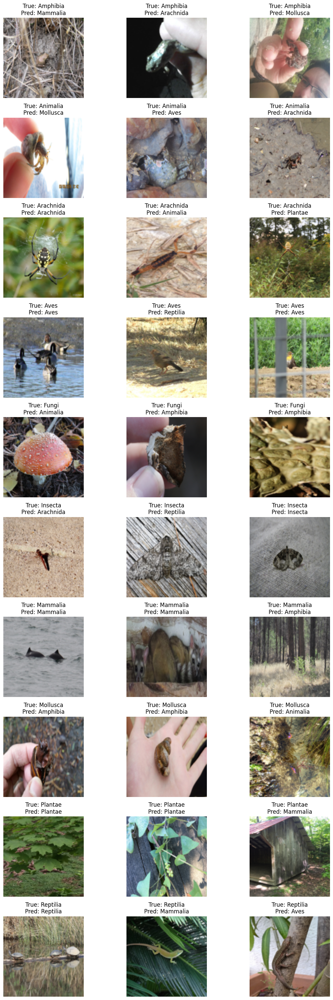

In [ ]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
import os


test_path = "/kaggle/input/inaturalist-dataset/inaturalist_12K/val" 
test_transform = transforms.Compose([
    transforms.Resize((common_config["img_size"], common_config["img_size"])),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

test_dataset = datasets.ImageFolder(root=test_path, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=common_config["batch_size"], shuffle=False, num_workers=2)

# loading the best model from the checkpoint
best_config = {
    "img_size": 128,
    "num_classes": 10,
    "batch_size": 32,
    "epochs": 10,
    "filter_organization": "double",   
    "activation": "silu",               
    "data_augmentation": True,
    "batch_norm": True,
    "dropout": 0.3,
    "dense_neurons": 256,
    "learning_rate": 1e-4
}
checkpoint_path = "/kaggle/working/best_model_checkpoints/best_model_cnn.ckpt"  
best_model = LitCNN.load_from_checkpoint(checkpoint_path, config=best_config)
best_model.eval()
if torch.cuda.is_available():
    best_model.to("cuda")

test_loss = 0.0
test_correct = 0
test_total = 0

for images, labels in test_loader:
    if torch.cuda.is_available():
        images, labels = images.to("cuda"), labels.to("cuda")
    outputs = best_model(images)
    loss = F.cross_entropy(outputs, labels)
    test_loss += loss.item() * images.size(0)
    _, predicted = torch.max(outputs, 1)
    test_total += labels.size(0)
    test_correct += (predicted == labels).sum().item()

test_loss = test_loss / test_total
test_acc = test_correct / test_total

print("Test Loss:", test_loss)
print("Test Accuracy:", test_acc)

# Creating a 10x3 Grid of Sample Test Images (Each row = one true class) 
samples_per_class = {i: [] for i in range(10)}
for img, label in test_dataset:
    if len(samples_per_class[label]) < 3:
        samples_per_class[label].append(img)
    if all(len(v) == 3 for v in samples_per_class.values()):
        break

# Get predictions for each collected sample
predictions = {}
for cls in range(10):
    imgs = torch.stack(samples_per_class[cls])  
    if torch.cuda.is_available():
        imgs = imgs.to("cuda")
    outputs = best_model(imgs)
    _, preds = torch.max(outputs, 1)
    predictions[cls] = preds.cpu().tolist()

# Function to denormalize images for visualization
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(-1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(-1, 1, 1)
    tensor = tensor * std + mean
    return tensor.clamp(0, 1)

class_names = test_dataset.classes

fig, axes = plt.subplots(10, 3, figsize=(12, 30))
for cls in range(10):
    for j in range(3):
        img = samples_per_class[cls][j]
        img = denormalize(img)
        ax = axes[cls][j]
        ax.imshow(img.permute(1, 2, 0))
        true_name = class_names[cls]
        pred_name = class_names[predictions[cls][j]]
        ax.set_title(f"True: {true_name}\nPred: {pred_name}")
        ax.axis("off")
plt.tight_layout()
plt.show()
output_path = "test_images_grid.png"
fig.savefig(output_path)
wandb.log({"test_images_grid": wandb.Image(output_path)})
plt.show()

### Visualizing first conv layer filters

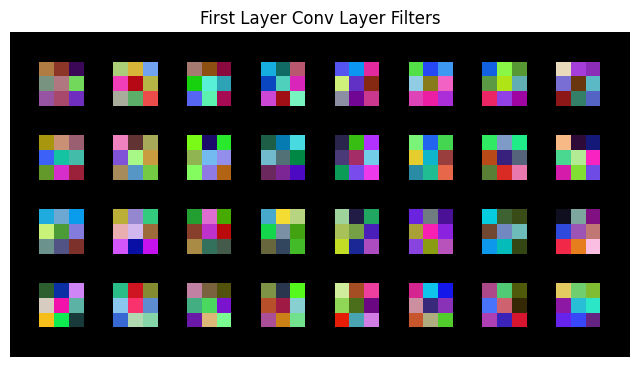

In [ ]:
# the first convolutional layer is the very first module in best_model.conv.
first_conv = best_model.conv[0]
weights = first_conv.weight.data.clone().cpu()

min_w = weights.min()
max_w = weights.max()
weights = (weights - min_w) / (max_w - min_w)

# Creating an 8x8 grid if there are 64 filters 
grid = torchvision.utils.make_grid(weights, nrow=8, padding=2)
plt.figure(figsize=(8, 8))
plt.imshow(grid.permute(1, 2, 0))
plt.title("First Layer Conv Layer Filters")
plt.axis("off")
plt.show()


#### GuidedBackprop code

Test folder not found. Using validation folder as test set.


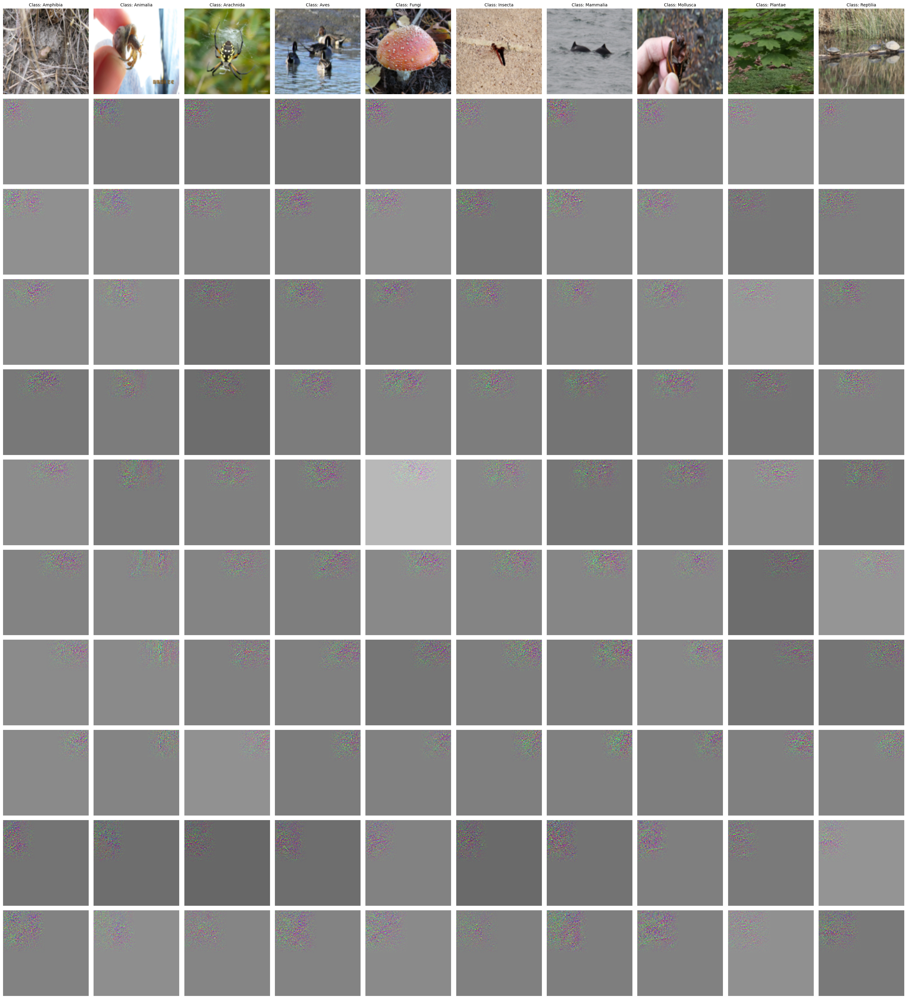

In [ ]:
class GuidedBackprop:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        # backward hooks on all ReLU layers
        self._register_hooks()
        # for capturing the target layer's forward output
        self.forward_output = None

    def _register_hooks(self):
        def relu_backward_hook(module, grad_in, grad_out):
            return tuple(torch.clamp(g, min=0.0) for g in grad_in)
        for module in self.model.modules():
            if isinstance(module, nn.ReLU):
                module.register_backward_hook(relu_backward_hook)

    def hook_layer(self, layer):
        def forward_hook(module, input, output):
            self.forward_output = output
        self.handle = layer.register_forward_hook(forward_hook)

    def generate_gradients(self, input_image, target_neuron_idx):
        input_image.retain_grad()
        self.model.zero_grad()
        output = self.model(input_image)
        conv_output = self.forward_output
        target_activation = conv_output[0].view(-1)[target_neuron_idx]
        target_activation.backward(retain_graph=True)
        if input_image.grad is None:
            raise ValueError("No gradient propagated to the input image.")
        guided_gradients = input_image.grad.data.cpu().numpy()[0]
        return guided_gradients

    def remove_hook(self):
        self.handle.remove()


test_path = "/kaggle/input/inaturalist-dataset/inaturalist_12K/val"  

test_transform = transforms.Compose([
    transforms.Resize((common_config["img_size"], common_config["img_size"])),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Load test dataset ---
test_dataset = datasets.ImageFolder(root=test_path, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=common_config["batch_size"], shuffle=False, num_workers=2)

# Create a dictionary to store one image per class.
samples_per_class = {}
for img, label in test_dataset:
    if label not in samples_per_class:
        # Create a leaf tensor with requires_grad True.
        sample = img.unsqueeze(0).clone().detach().requires_grad_(True)
        samples_per_class[label] = sample
    if len(samples_per_class) == len(test_dataset.classes):
        break


# Load your best model checkpoint (adjust the path and config as necessary)
best_config = {
    "img_size": 128,
    "num_classes": 10,
    "batch_size": 32,
    "epochs": 10,
    "filter_organization": "double",   
    "activation": "silu",               
    "data_augmentation": True,
    "batch_norm": True,
    "dropout": 0.3,
    "dense_neurons": 256,
    "learning_rate": 1e-4
}
checkpoint_path = "/kaggle/input/ass2_parta/pytorch/default/1/best_model_cnn.ckpt"  
best_model = LitCNN.load_from_checkpoint(checkpoint_path, config=best_config)
best_model.eval()
if torch.cuda.is_available():
    best_model.to("cuda")

last_conv = None
for module in best_model.conv:
    if isinstance(module, nn.Conv2d):
        last_conv = module  
if last_conv is None:
    raise ValueError("No Conv2d layer found in the model's conv block.")

gbp = GuidedBackprop(best_model)
gbp.hook_layer(last_conv)


neuron_indices = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

guided_results = {}  
for cls in sorted(samples_per_class.keys()):
    sample_img = samples_per_class[cls]
    if torch.cuda.is_available():
        sample_img = sample_img.to("cuda")
    guided_imgs = []
    for idx in neuron_indices:
        best_model.zero_grad()
        sample_img.grad = None
        guided_grad = gbp.generate_gradients(sample_img, idx)
        guided_grad_norm = (guided_grad - guided_grad.min()) / (guided_grad.max() - guided_grad.min() + 1e-8)
        guided_imgs.append(guided_grad_norm.transpose(1, 2, 0))
    guided_results[cls] = guided_imgs

gbp.remove_hook()


num_rows = 1 + len(neuron_indices)
num_cols = len(test_dataset.classes) 
fig, axes = plt.subplots(num_rows, num_cols, figsize=(3*num_cols, 3*num_rows))


if num_rows == 1:
    axes = [axes]
elif num_cols == 1:
    axes = [[ax] for ax in axes]

class_names = test_dataset.classes

def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406])
    std = torch.tensor([0.229, 0.224, 0.225])
    tensor = tensor.cpu()  # ensure on CPU
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor.clamp(0, 1)

for col, cls in enumerate(sorted(samples_per_class.keys())):
    orig_img = samples_per_class[cls].detach().cpu()[0]  
    orig_img = denormalize(orig_img)
    ax = axes[0][col]
    ax.imshow(orig_img.permute(1, 2, 0))
    ax.set_title(f"Class: {class_names[cls]}", fontsize=10)
    ax.axis("off")

for col, cls in enumerate(sorted(guided_results.keys())):
    for row in range(1, num_rows):
        ax = axes[row][col]
        ax.imshow(guided_results[cls][row-1])
        ax.set_ylabel(f"Neuron {neuron_indices[row-1]}", fontsize=8)
        ax.axis("off")

plt.tight_layout()
plt.show()

plt.show()
output_path = "../guided_backprop_grid.png"
fig.savefig(output_path)
wandb.log({"guided_backprop_grid": wandb.Image(output_path)})

plt.show()
